In [1]:
import torch
import json
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
import numpy as np
import pandas as pd
from PIL import Image
import os
import matplotlib.pyplot as plt
import seaborn as sns

/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Load the JSON file
with open('binary_multilabels.json', 'r') as f:
    labels_data = json.load(f)

# Extract tags
tags = ["fish_tail", "shading", "short_descender", "string", "vertical_stretch", 
        "nikud", "left_justify", "nesting", "left_slanted", "bited_aleph"]

tag_to_idx = {tag: idx for idx, tag in enumerate(tags)}

# Create a dictionary to store tags for each manuscript
manuscript_tags = {}

for image_info in labels_data['images']:
    manuscript_id = image_info['image_name'].split('_')[0]
    if manuscript_id not in manuscript_tags:
        manuscript_tags[manuscript_id] = image_info['tags']


In [3]:
tag_to_idx

{'fish_tail': 0,
 'shading': 1,
 'short_descender': 2,
 'string': 3,
 'vertical_stretch': 4,
 'nikud': 5,
 'left_justify': 6,
 'nesting': 7,
 'left_slanted': 8,
 'bited_aleph': 9}

In [4]:
manuscript_id = '000'
tags = manuscript_tags[manuscript_id]
img_label = [0] * len(tag_to_idx)
for tag in tags:
    img_label[tag_to_idx[tag]] = 1
img_label=torch.FloatTensor(img_label)

In [5]:
img_label

tensor([1., 1., 1., 1., 1., 1., 1., 0., 1., 0.])

In [6]:
import os
import pandas as pd
from PIL import Image
import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset, Subset
import glob
import numpy as np

class InvertImage(object):
    def __call__(self, img):
        return 1 - img
class ImageDataset(Dataset):
    def __init__(self, data_dir, manuscript_tags, tag_to_idx, img_size=256):
        self.data_dir = data_dir
        self.img_size = img_size
        self.manuscript_tags = manuscript_tags
        self.image_files = sorted([f for f in os.listdir(data_dir) if f.endswith('.jpeg')])

        self.transforms = transforms.Compose([
            transforms.Grayscale(num_output_channels=3),
            transforms.Resize((self.img_size, self.img_size)),
            transforms.ToTensor(),
            InvertImage(), 
            transforms.Normalize([0.5], [0.5])
        ])
        
    def __len__(self):
        return len((self.image_files))
    
    def __getitem__(self, idx):
        img_name = self.image_files[idx]
        img_file = os.path.join(self.data_dir, img_name)
        manuscript_id = img_name.split('_')[0]
        tags = self.manuscript_tags[manuscript_id]
        img_label = [0] * len(tag_to_idx)
        for tag in tags:
            img_label[tag_to_idx[tag]] = 1
        img_label=torch.FloatTensor(img_label)

        img = Image.open(img_file).convert('RGB')
        
        img = self.transforms(img)
        
        return img, img_label

In [7]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision.models import vgg16
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.cuda.set_device(2)

# Define batch size and number of epochs
batch_size = 16
num_epochs = 35

# Initialize ImageDataset for the entire dataset
dataset = ImageDataset('normalized_grayscale_regions',manuscript_tags,tag_to_idx)

# Define the percentages for each split
train_percentage = 0.9
val_percentage = 0.05
test_percentage = 0.05

# Get the number of samples in the dataset
dataset_size = len(dataset)

# Get the indices for the entire dataset
indices = list(range(dataset_size))

# Add a random seed for reproducibility
random_seed = 11
np.random.seed(random_seed)

# Shuffle the indices 
np.random.shuffle(indices)

# Calculate the number of samples in each split
n_train = int(np.floor(train_percentage * dataset_size))
n_val = int(np.floor(val_percentage * dataset_size))
n_test = int(np.floor(test_percentage * dataset_size))


In [8]:
dataset_size

457

In [9]:
n_train = n_train+2

In [10]:
print("Number of samples in the training set:", n_train)
print("Number of samples in the validation set:", n_val)
print("Number of samples in the test set:", n_test)

Number of samples in the training set: 413
Number of samples in the validation set: 22
Number of samples in the test set: 22


In [11]:
# Split the dataset into training, validation, and testing subsets
train_subset = Subset(dataset, indices[:n_train])
val_subset = Subset(dataset, indices[n_train:n_train+n_val])
test_subset = Subset(dataset, indices[n_train+n_val:])

# Initialize DataLoader for training, validation, and testing subsets
train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_subset, batch_size=batch_size, shuffle=True)

In [12]:
image_file_names = sorted([f for f in os.listdir('normalized_grayscale_regions') if f.endswith('.jpeg')])


In [13]:
train_names = image_file_names[:n_train]
val_names = image_file_names[n_train:n_train+n_val]
test_names = image_file_names[n_train+n_val:]

# Define a function to filter names based on the required pattern
def filter_names(names):
    return [name for name in names if name[3:10] == '_000_00' and name.endswith('.jpeg')]

# Apply the filter function to each set
filtered_train_names = filter_names(train_names)
filtered_val_names = filter_names(val_names)
filtered_test_names = filter_names(test_names)

print("Filtered Train set image names:", filtered_train_names)
print("Filtered Validation set image names:", filtered_val_names)
print("Filtered Test set image names:", filtered_test_names)


Filtered Train set image names: ['000_000_00.jpeg', '001_000_00.jpeg', '002_000_00.jpeg', '003_000_00.jpeg', '004_000_00.jpeg', '005_000_00.jpeg', '006_000_00.jpeg', '007_000_00.jpeg', '008_000_00.jpeg', '009_000_00.jpeg', '010_000_00.jpeg', '011_000_00.jpeg', '012_000_00.jpeg', '013_000_00.jpeg', '014_000_00.jpeg', '015_000_00.jpeg', '016_000_00.jpeg', '017_000_00.jpeg', '018_000_00.jpeg', '019_000_00.jpeg', '020_000_00.jpeg', '021_000_00.jpeg', '022_000_00.jpeg', '023_000_00.jpeg', '024_000_00.jpeg', '025_000_00.jpeg', '026_000_00.jpeg', '027_000_00.jpeg', '028_000_00.jpeg', '029_000_00.jpeg', '030_000_00.jpeg', '031_000_00.jpeg', '032_000_00.jpeg', '033_000_00.jpeg', '034_000_00.jpeg', '035_000_00.jpeg', '036_000_00.jpeg', '037_000_00.jpeg', '038_000_00.jpeg', '039_000_00.jpeg', '040_000_00.jpeg', '041_000_00.jpeg', '042_000_00.jpeg', '043_000_00.jpeg', '044_000_00.jpeg', '045_000_00.jpeg', '046_000_00.jpeg']
Filtered Validation set image names: ['047_000_00.jpeg', '048_000_00.jpeg'

In [14]:


vgg = vgg16(pretrained=True)

# Get number of input features to the last layer
num_features = vgg.classifier[-1].in_features 

# Define new last layer that outputs 10-dimensional tensor
last_layer = nn.Linear(num_features, 10)
# last_layer = nn.Sequential(
#     nn.Dropout(0.3),
#     nn.Linear(num_features, 10)
# )

# Modify the last layer
vgg.classifier[-1] = last_layer

# Define loss function and optimizer
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(vgg.parameters(), lr=0.0001)

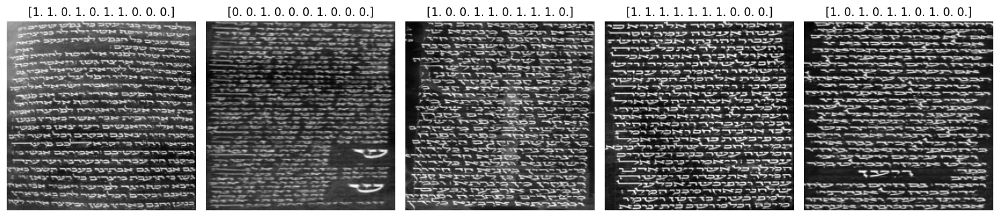

In [15]:
import matplotlib.pyplot as plt
import numpy as np

# Get a batch of sample images from the train loader
sample_images, sample_labels = next(iter(train_loader))

# Convert images to numpy array for display
sample_images = sample_images.numpy()

# Extract the first 5 images and labels from the batch
sample_images = sample_images[:5]
sample_labels = sample_labels[:5]

# Convert the labels tensor to a numpy array for display
sample_labels = sample_labels.numpy()

# Create a figure with subplots for each sample image
fig, axs = plt.subplots(nrows=1, ncols=len(sample_images), figsize=(15, 5))

# Display each image and label using the corresponding subplot
for i in range(len(sample_images)):
    # Convert the image to grayscale
    grayscale_image = np.squeeze(sample_images[i]).mean(axis=0)
    axs[i].imshow(grayscale_image, cmap='gray')
    axs[i].set_axis_off()
    title = str(sample_labels[i])
    axs[i].set_title(title)

# Show the plot
plt.tight_layout()
plt.show()

In [16]:
import torch
import torch.nn.functional as F
import numpy as np
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt

train_losses = []
val_losses = []
train_class_f1s = []
val_class_f1s = []


vgg.to(device)
best_val_loss = float('inf')

def calculate_metrics(outputs, labels, target_names):
    outputs = torch.sigmoid(outputs) > 0.5
    outputs = outputs.cpu().numpy()
    labels = labels.cpu().numpy()
    report = classification_report(labels, outputs, target_names=target_names, output_dict=True)
    return report

target_names =  ["fish_tail", "shading", "short_descender", "string", "vertical_stretch", 
                "nikud", "left_justify", "nesting", "left_slanted", "bited_aleph"]

for epoch in range(num_epochs):
    running_loss = 0.0
    all_labels = []
    all_outputs = []
    
    vgg.train()
    for inputs, labels in train_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)
        
        optimizer.zero_grad()
        
        outputs = vgg(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item() * inputs.size(0)
        
        all_labels.append(labels)
        all_outputs.append(outputs)
        
    epoch_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_loss)
    
    all_labels = torch.cat(all_labels)
    all_outputs = torch.cat(all_outputs)
    train_report = calculate_metrics(all_outputs, all_labels, target_names)
    
    # Extract class-wise F1-scores and support
    class_f1s = {cls: train_report[cls]['f1-score'] for cls in target_names}
    train_class_f1s.append(class_f1s)
    
    print(f'Epoch {epoch+1} Train Loss: {epoch_loss:.4f}')
    print(f'Train Classification Report:\n{classification_report(all_labels.cpu().numpy(), (torch.sigmoid(all_outputs) > 0.5).cpu().numpy(), target_names=target_names)}')
    
    # Evaluate the model on validation set
    vgg.eval()
    val_loss = 0.0
    all_labels = []
    all_outputs = []
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            
            outputs = vgg(inputs)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * inputs.size(0)
            
            all_labels.append(labels)
            all_outputs.append(outputs)
            
    epoch_val_loss = val_loss / len(val_loader.dataset)
    val_losses.append(epoch_val_loss)
    
    all_labels = torch.cat(all_labels)
    all_outputs = torch.cat(all_outputs)
    val_report = calculate_metrics(all_outputs, all_labels, target_names)
    
    # Extract class-wise F1-scores and support
    class_f1s = {cls: val_report[cls]['f1-score'] for cls in target_names}
    val_class_f1s.append(class_f1s)
    
    print(f'Epoch {epoch+1} Validation Loss: {epoch_val_loss:.4f}')
    print(f'Validation Classification Report:\n{classification_report(all_labels.cpu().numpy(), (torch.sigmoid(all_outputs) > 0.5).cpu().numpy(), target_names=target_names)}')
    
    # Update best_val_loss and save model if the current validation loss is lower than the previous min
    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        torch.save(vgg.state_dict(), 'best_model.pth')


Epoch 1 Train Loss: 0.5719
Train Classification Report:
                  precision    recall  f1-score   support

       fish_tail       0.79      0.90      0.84       286
         shading       0.59      0.71      0.64       227
 short_descender       0.72      0.95      0.82       292
          string       0.64      0.86      0.74       258
vertical_stretch       0.60      0.77      0.67       244
           nikud       0.82      0.88      0.85       320
    left_justify       0.62      0.80      0.70       247
         nesting       0.62      0.68      0.65       215
    left_slanted       0.00      0.00      0.00       101
     bited_aleph       0.00      0.00      0.00        11

       micro avg       0.68      0.79      0.73      2201
       macro avg       0.54      0.66      0.59      2201
    weighted avg       0.65      0.79      0.71      2201
     samples avg       0.68      0.79      0.71      2201



/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg

Epoch 1 Validation Loss: 0.5320
Validation Classification Report:
                  precision    recall  f1-score   support

       fish_tail       0.82      1.00      0.90        18
         shading       0.60      0.55      0.57        11
 short_descender       0.86      1.00      0.93        19
          string       0.45      1.00      0.62        10
vertical_stretch       0.55      1.00      0.71        11
           nikud       0.86      1.00      0.93        19
    left_justify       0.62      0.93      0.74        14
         nesting       0.62      0.56      0.59         9
    left_slanted       0.00      0.00      0.00         6
     bited_aleph       0.00      0.00      0.00         0

       micro avg       0.69      0.86      0.77       117
       macro avg       0.54      0.70      0.60       117
    weighted avg       0.68      0.86      0.75       117
     samples avg       0.69      0.88      0.76       117



/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch 2 Train Loss: 0.4974
Train Classification Report:
                  precision    recall  f1-score   support

       fish_tail       0.86      0.96      0.91       286
         shading       0.66      0.78      0.72       227
 short_descender       0.73      0.94      0.82       292
          string       0.71      0.90      0.79       258
vertical_stretch       0.62      0.83      0.71       244
           nikud       0.87      0.96      0.91       320
    left_justify       0.65      0.85      0.73       247
         nesting       0.65      0.66      0.66       215
    left_slanted       0.60      0.03      0.06       101
     bited_aleph       0.00      0.00      0.00        11

       micro avg       0.72      0.83      0.77      2201
       macro avg       0.63      0.69      0.63      2201
    weighted avg       0.72      0.83      0.75      2201
     samples avg       0.73      0.83      0.76      2201



/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg

Epoch 2 Validation Loss: 0.4818
Validation Classification Report:
                  precision    recall  f1-score   support

       fish_tail       0.94      0.83      0.88        18
         shading       0.60      0.82      0.69        11
 short_descender       0.86      1.00      0.93        19
          string       0.60      0.90      0.72        10
vertical_stretch       0.50      1.00      0.67        11
           nikud       0.86      0.95      0.90        19
    left_justify       0.69      0.64      0.67        14
         nesting       0.67      0.67      0.67         9
    left_slanted       0.60      0.50      0.55         6
     bited_aleph       0.00      0.00      0.00         0

       micro avg       0.72      0.85      0.78       117
       macro avg       0.63      0.73      0.67       117
    weighted avg       0.74      0.85      0.78       117
     samples avg       0.71      0.84      0.76       117



/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch 3 Train Loss: 0.4038
Train Classification Report:
                  precision    recall  f1-score   support

       fish_tail       0.91      0.95      0.93       286
         shading       0.78      0.85      0.81       227
 short_descender       0.81      0.98      0.89       292
          string       0.79      0.93      0.85       258
vertical_stretch       0.68      0.84      0.75       244
           nikud       0.88      0.98      0.93       320
    left_justify       0.72      0.85      0.78       247
         nesting       0.75      0.72      0.73       215
    left_slanted       0.66      0.42      0.51       101
     bited_aleph       0.00      0.00      0.00        11

       micro avg       0.79      0.87      0.83      2201
       macro avg       0.70      0.75      0.72      2201
    weighted avg       0.79      0.87      0.82      2201
     samples avg       0.79      0.88      0.82      2201



/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg

Epoch 3 Validation Loss: 0.4070
Validation Classification Report:
                  precision    recall  f1-score   support

       fish_tail       0.94      0.94      0.94        18
         shading       0.69      0.82      0.75        11
 short_descender       0.90      0.95      0.92        19
          string       0.73      0.80      0.76        10
vertical_stretch       0.53      0.82      0.64        11
           nikud       0.86      1.00      0.93        19
    left_justify       0.69      0.79      0.73        14
         nesting       0.70      0.78      0.74         9
    left_slanted       0.67      0.33      0.44         6
     bited_aleph       0.00      0.00      0.00         0

       micro avg       0.77      0.85      0.81       117
       macro avg       0.67      0.72      0.69       117
    weighted avg       0.78      0.85      0.81       117
     samples avg       0.76      0.85      0.80       117

Epoch 4 Train Loss: 0.3479
Train Classification Report:
     

/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg

Epoch 4 Validation Loss: 0.4603
Validation Classification Report:
                  precision    recall  f1-score   support

       fish_tail       0.94      0.94      0.94        18
         shading       0.77      0.91      0.83        11
 short_descender       0.90      0.95      0.92        19
          string       0.56      1.00      0.71        10
vertical_stretch       0.69      0.82      0.75        11
           nikud       0.86      0.95      0.90        19
    left_justify       0.75      0.86      0.80        14
         nesting       0.78      0.78      0.78         9
    left_slanted       1.00      0.67      0.80         6
     bited_aleph       0.00      0.00      0.00         0

       micro avg       0.80      0.90      0.84       117
       macro avg       0.72      0.79      0.74       117
    weighted avg       0.82      0.90      0.85       117
     samples avg       0.80      0.90      0.84       117

Epoch 5 Train Loss: 0.2965
Train Classification Report:
     

/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg

Epoch 5 Validation Loss: 0.4519
Validation Classification Report:
                  precision    recall  f1-score   support

       fish_tail       1.00      0.83      0.91        18
         shading       0.77      0.91      0.83        11
 short_descender       0.90      0.95      0.92        19
          string       0.75      0.90      0.82        10
vertical_stretch       0.69      0.82      0.75        11
           nikud       0.95      0.95      0.95        19
    left_justify       0.79      0.79      0.79        14
         nesting       0.75      0.67      0.71         9
    left_slanted       1.00      0.67      0.80         6
     bited_aleph       0.00      0.00      0.00         0

       micro avg       0.85      0.85      0.85       117
       macro avg       0.76      0.75      0.75       117
    weighted avg       0.86      0.85      0.85       117
     samples avg       0.84      0.85      0.82       117

Epoch 6 Train Loss: 0.2873
Train Classification Report:
     

/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg

Epoch 6 Validation Loss: 0.2872
Validation Classification Report:
                  precision    recall  f1-score   support

       fish_tail       0.90      1.00      0.95        18
         shading       0.82      0.82      0.82        11
 short_descender       0.90      0.95      0.92        19
          string       0.64      0.90      0.75        10
vertical_stretch       0.90      0.82      0.86        11
           nikud       0.95      1.00      0.97        19
    left_justify       0.80      0.86      0.83        14
         nesting       0.78      0.78      0.78         9
    left_slanted       1.00      0.50      0.67         6
     bited_aleph       0.00      0.00      0.00         0

       micro avg       0.85      0.89      0.87       117
       macro avg       0.77      0.76      0.75       117
    weighted avg       0.86      0.89      0.87       117
     samples avg       0.84      0.88      0.85       117

Epoch 7 Train Loss: 0.2712
Train Classification Report:
     

/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg

Epoch 7 Validation Loss: 0.2653
Validation Classification Report:
                  precision    recall  f1-score   support

       fish_tail       0.90      1.00      0.95        18
         shading       0.90      0.82      0.86        11
 short_descender       0.95      0.95      0.95        19
          string       0.86      0.60      0.71        10
vertical_stretch       0.89      0.73      0.80        11
           nikud       0.95      1.00      0.97        19
    left_justify       0.79      0.79      0.79        14
         nesting       0.75      1.00      0.86         9
    left_slanted       0.80      0.67      0.73         6
     bited_aleph       0.00      0.00      0.00         0

       micro avg       0.88      0.87      0.88       117
       macro avg       0.78      0.75      0.76       117
    weighted avg       0.88      0.87      0.87       117
     samples avg       0.88      0.88      0.87       117

Epoch 8 Train Loss: 0.2249
Train Classification Report:
     

/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg

Epoch 8 Validation Loss: 0.2352
Validation Classification Report:
                  precision    recall  f1-score   support

       fish_tail       0.94      0.94      0.94        18
         shading       0.90      0.82      0.86        11
 short_descender       0.90      1.00      0.95        19
          string       0.90      0.90      0.90        10
vertical_stretch       0.85      1.00      0.92        11
           nikud       0.95      1.00      0.97        19
    left_justify       0.78      1.00      0.88        14
         nesting       0.88      0.78      0.82         9
    left_slanted       1.00      0.83      0.91         6
     bited_aleph       0.00      0.00      0.00         0

       micro avg       0.89      0.94      0.92       117
       macro avg       0.81      0.83      0.82       117
    weighted avg       0.90      0.94      0.92       117
     samples avg       0.89      0.94      0.91       117

Epoch 9 Train Loss: 0.1435
Train Classification Report:
     

/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg

Epoch 9 Validation Loss: 0.1823
Validation Classification Report:
                  precision    recall  f1-score   support

       fish_tail       1.00      1.00      1.00        18
         shading       0.89      0.73      0.80        11
 short_descender       0.95      1.00      0.97        19
          string       1.00      0.80      0.89        10
vertical_stretch       0.85      1.00      0.92        11
           nikud       0.95      1.00      0.97        19
    left_justify       1.00      0.93      0.96        14
         nesting       1.00      0.89      0.94         9
    left_slanted       1.00      1.00      1.00         6
     bited_aleph       0.00      0.00      0.00         0

       micro avg       0.96      0.94      0.95       117
       macro avg       0.86      0.83      0.85       117
    weighted avg       0.96      0.94      0.95       117
     samples avg       0.96      0.94      0.94       117

Epoch 10 Train Loss: 0.1103
Train Classification Report:
    

/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg

Epoch 10 Validation Loss: 0.2717
Validation Classification Report:
                  precision    recall  f1-score   support

       fish_tail       0.95      1.00      0.97        18
         shading       0.89      0.73      0.80        11
 short_descender       0.95      1.00      0.97        19
          string       0.80      0.80      0.80        10
vertical_stretch       1.00      0.73      0.84        11
           nikud       0.86      1.00      0.93        19
    left_justify       0.88      1.00      0.93        14
         nesting       1.00      0.89      0.94         9
    left_slanted       1.00      1.00      1.00         6
     bited_aleph       0.00      0.00      0.00         0

       micro avg       0.92      0.92      0.92       117
       macro avg       0.83      0.81      0.82       117
    weighted avg       0.92      0.92      0.92       117
     samples avg       0.92      0.93      0.92       117

Epoch 11 Train Loss: 0.1077
Train Classification Report:
   

/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg

Epoch 11 Validation Loss: 0.1483
Validation Classification Report:
                  precision    recall  f1-score   support

       fish_tail       0.95      1.00      0.97        18
         shading       0.85      1.00      0.92        11
 short_descender       1.00      1.00      1.00        19
          string       0.71      1.00      0.83        10
vertical_stretch       0.92      1.00      0.96        11
           nikud       1.00      1.00      1.00        19
    left_justify       1.00      0.71      0.83        14
         nesting       1.00      0.89      0.94         9
    left_slanted       1.00      1.00      1.00         6
     bited_aleph       0.00      0.00      0.00         0

       micro avg       0.93      0.96      0.95       117
       macro avg       0.84      0.86      0.85       117
    weighted avg       0.95      0.96      0.95       117
     samples avg       0.93      0.95      0.94       117

Epoch 12 Train Loss: 0.1371
Train Classification Report:
   

/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg

Epoch 13 Train Loss: 0.1452
Train Classification Report:
                  precision    recall  f1-score   support

       fish_tail       0.97      0.99      0.98       286
         shading       0.91      0.93      0.92       227
 short_descender       0.96      0.97      0.97       292
          string       0.92      0.95      0.93       258
vertical_stretch       0.90      0.93      0.91       244
           nikud       0.98      0.99      0.98       320
    left_justify       0.92      0.94      0.93       247
         nesting       0.97      0.92      0.95       215
    left_slanted       0.98      0.91      0.94       101
     bited_aleph       0.90      0.82      0.86        11

       micro avg       0.94      0.95      0.95      2201
       macro avg       0.94      0.94      0.94      2201
    weighted avg       0.94      0.95      0.95      2201
     samples avg       0.94      0.95      0.94      2201



/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg

Epoch 13 Validation Loss: 0.1949
Validation Classification Report:
                  precision    recall  f1-score   support

       fish_tail       0.95      1.00      0.97        18
         shading       1.00      0.82      0.90        11
 short_descender       0.95      1.00      0.97        19
          string       0.88      0.70      0.78        10
vertical_stretch       0.90      0.82      0.86        11
           nikud       0.95      1.00      0.97        19
    left_justify       1.00      0.86      0.92        14
         nesting       0.86      0.67      0.75         9
    left_slanted       1.00      0.83      0.91         6
     bited_aleph       0.00      0.00      0.00         0

       micro avg       0.95      0.89      0.92       117
       macro avg       0.85      0.77      0.80       117
    weighted avg       0.94      0.89      0.91       117
     samples avg       0.95      0.91      0.92       117

Epoch 14 Train Loss: 0.1040
Train Classification Report:
   

/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg

Epoch 14 Validation Loss: 0.1797
Validation Classification Report:
                  precision    recall  f1-score   support

       fish_tail       0.95      1.00      0.97        18
         shading       0.91      0.91      0.91        11
 short_descender       0.90      1.00      0.95        19
          string       0.91      1.00      0.95        10
vertical_stretch       1.00      0.91      0.95        11
           nikud       0.95      1.00      0.97        19
    left_justify       1.00      0.86      0.92        14
         nesting       1.00      0.78      0.88         9
    left_slanted       1.00      0.83      0.91         6
     bited_aleph       0.00      0.00      0.00         0

       micro avg       0.95      0.94      0.94       117
       macro avg       0.86      0.83      0.84       117
    weighted avg       0.95      0.94      0.94       117
     samples avg       0.95      0.94      0.94       117

Epoch 15 Train Loss: 0.0981
Train Classification Report:
   

/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg

Epoch 15 Validation Loss: 0.1191
Validation Classification Report:
                  precision    recall  f1-score   support

       fish_tail       0.95      1.00      0.97        18
         shading       0.85      1.00      0.92        11
 short_descender       1.00      1.00      1.00        19
          string       1.00      1.00      1.00        10
vertical_stretch       0.82      0.82      0.82        11
           nikud       1.00      1.00      1.00        19
    left_justify       0.93      0.93      0.93        14
         nesting       1.00      0.78      0.88         9
    left_slanted       1.00      1.00      1.00         6
     bited_aleph       0.00      0.00      0.00         0

       micro avg       0.95      0.96      0.95       117
       macro avg       0.85      0.85      0.85       117
    weighted avg       0.95      0.96      0.95       117
     samples avg       0.95      0.96      0.95       117

Epoch 16 Train Loss: 0.1089
Train Classification Report:
   

/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg

Epoch 16 Validation Loss: 0.1997
Validation Classification Report:
                  precision    recall  f1-score   support

       fish_tail       0.95      1.00      0.97        18
         shading       0.82      0.82      0.82        11
 short_descender       1.00      0.95      0.97        19
          string       0.75      0.90      0.82        10
vertical_stretch       0.77      0.91      0.83        11
           nikud       1.00      1.00      1.00        19
    left_justify       0.93      0.93      0.93        14
         nesting       1.00      0.89      0.94         9
    left_slanted       0.83      0.83      0.83         6
     bited_aleph       0.00      0.00      0.00         0

       micro avg       0.91      0.93      0.92       117
       macro avg       0.80      0.82      0.81       117
    weighted avg       0.91      0.93      0.92       117
     samples avg       0.92      0.94      0.92       117

Epoch 17 Train Loss: 0.1518
Train Classification Report:
   

/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg

Epoch 17 Validation Loss: 0.2149
Validation Classification Report:
                  precision    recall  f1-score   support

       fish_tail       0.89      0.94      0.92        18
         shading       0.79      1.00      0.88        11
 short_descender       0.95      0.95      0.95        19
          string       0.77      1.00      0.87        10
vertical_stretch       0.75      0.82      0.78        11
           nikud       1.00      1.00      1.00        19
    left_justify       0.76      0.93      0.84        14
         nesting       1.00      0.89      0.94         9
    left_slanted       0.86      1.00      0.92         6
     bited_aleph       0.00      0.00      0.00         0

       micro avg       0.87      0.95      0.91       117
       macro avg       0.78      0.85      0.81       117
    weighted avg       0.88      0.95      0.91       117
     samples avg       0.87      0.94      0.90       117



/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch 18 Train Loss: 0.1649
Train Classification Report:
                  precision    recall  f1-score   support

       fish_tail       0.96      0.99      0.98       286
         shading       0.94      0.96      0.95       227
 short_descender       0.91      0.95      0.93       292
          string       0.93      0.97      0.95       258
vertical_stretch       0.92      0.93      0.92       244
           nikud       0.97      0.96      0.97       320
    left_justify       0.92      0.97      0.94       247
         nesting       0.94      0.94      0.94       215
    left_slanted       0.81      0.84      0.83       101
     bited_aleph       0.00      0.00      0.00        11

       micro avg       0.93      0.95      0.94      2201
       macro avg       0.83      0.85      0.84      2201
    weighted avg       0.93      0.95      0.94      2201
     samples avg       0.93      0.95      0.93      2201



/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg

Epoch 18 Validation Loss: 0.3162
Validation Classification Report:
                  precision    recall  f1-score   support

       fish_tail       0.94      0.94      0.94        18
         shading       1.00      0.73      0.84        11
 short_descender       0.95      0.95      0.95        19
          string       0.89      0.80      0.84        10
vertical_stretch       0.69      0.82      0.75        11
           nikud       0.95      0.95      0.95        19
    left_justify       0.91      0.71      0.80        14
         nesting       0.89      0.89      0.89         9
    left_slanted       0.75      1.00      0.86         6
     bited_aleph       0.00      0.00      0.00         0

       micro avg       0.89      0.87      0.88       117
       macro avg       0.80      0.78      0.78       117
    weighted avg       0.90      0.87      0.88       117
     samples avg       0.89      0.85      0.86       117

Epoch 19 Train Loss: 0.1588
Train Classification Report:
   

/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg

Epoch 19 Validation Loss: 0.2026
Validation Classification Report:
                  precision    recall  f1-score   support

       fish_tail       1.00      0.89      0.94        18
         shading       0.83      0.91      0.87        11
 short_descender       0.95      1.00      0.97        19
          string       0.89      0.80      0.84        10
vertical_stretch       0.91      0.91      0.91        11
           nikud       1.00      0.89      0.94        19
    left_justify       1.00      0.93      0.96        14
         nesting       1.00      0.78      0.88         9
    left_slanted       1.00      0.83      0.91         6
     bited_aleph       0.00      0.00      0.00         0

       micro avg       0.95      0.90      0.93       117
       macro avg       0.86      0.79      0.82       117
    weighted avg       0.96      0.90      0.92       117
     samples avg       0.95      0.89      0.91       117

Epoch 20 Train Loss: 0.1143
Train Classification Report:
   

/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg

Epoch 20 Validation Loss: 0.1592
Validation Classification Report:
                  precision    recall  f1-score   support

       fish_tail       1.00      1.00      1.00        18
         shading       0.91      0.91      0.91        11
 short_descender       1.00      1.00      1.00        19
          string       0.77      1.00      0.87        10
vertical_stretch       0.79      1.00      0.88        11
           nikud       1.00      1.00      1.00        19
    left_justify       1.00      0.93      0.96        14
         nesting       1.00      0.78      0.88         9
    left_slanted       0.67      1.00      0.80         6
     bited_aleph       0.00      0.00      0.00         0

       micro avg       0.92      0.97      0.94       117
       macro avg       0.81      0.86      0.83       117
    weighted avg       0.93      0.97      0.94       117
     samples avg       0.93      0.97      0.94       117

Epoch 21 Train Loss: 0.0586
Train Classification Report:
   

/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg

Epoch 21 Validation Loss: 0.1717
Validation Classification Report:
                  precision    recall  f1-score   support

       fish_tail       0.95      1.00      0.97        18
         shading       0.90      0.82      0.86        11
 short_descender       0.95      0.95      0.95        19
          string       0.90      0.90      0.90        10
vertical_stretch       0.89      0.73      0.80        11
           nikud       0.95      1.00      0.97        19
    left_justify       0.93      1.00      0.97        14
         nesting       1.00      0.89      0.94         9
    left_slanted       1.00      1.00      1.00         6
     bited_aleph       0.00      0.00      0.00         0

       micro avg       0.94      0.93      0.94       117
       macro avg       0.85      0.83      0.84       117
    weighted avg       0.94      0.93      0.93       117
     samples avg       0.95      0.93      0.94       117

Epoch 22 Train Loss: 0.0284
Train Classification Report:
   

/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg

Epoch 22 Validation Loss: 0.1402
Validation Classification Report:
                  precision    recall  f1-score   support

       fish_tail       0.94      0.94      0.94        18
         shading       0.83      0.91      0.87        11
 short_descender       1.00      1.00      1.00        19
          string       0.90      0.90      0.90        10
vertical_stretch       1.00      0.82      0.90        11
           nikud       1.00      1.00      1.00        19
    left_justify       1.00      0.93      0.96        14
         nesting       1.00      0.89      0.94         9
    left_slanted       1.00      0.83      0.91         6
     bited_aleph       0.00      0.00      0.00         0

       micro avg       0.96      0.93      0.95       117
       macro avg       0.87      0.82      0.84       117
    weighted avg       0.97      0.93      0.95       117
     samples avg       0.96      0.93      0.94       117

Epoch 23 Train Loss: 0.0292
Train Classification Report:
   

/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg

Epoch 23 Validation Loss: 0.2556
Validation Classification Report:
                  precision    recall  f1-score   support

       fish_tail       0.94      0.89      0.91        18
         shading       0.91      0.91      0.91        11
 short_descender       1.00      0.95      0.97        19
          string       0.80      0.80      0.80        10
vertical_stretch       1.00      0.64      0.78        11
           nikud       1.00      1.00      1.00        19
    left_justify       0.93      0.93      0.93        14
         nesting       1.00      0.78      0.88         9
    left_slanted       1.00      0.67      0.80         6
     bited_aleph       0.00      0.00      0.00         0

       micro avg       0.95      0.87      0.91       117
       macro avg       0.86      0.76      0.80       117
    weighted avg       0.96      0.87      0.91       117
     samples avg       0.95      0.88      0.90       117

Epoch 24 Train Loss: 0.0139
Train Classification Report:
   

/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg

Epoch 24 Validation Loss: 0.1488
Validation Classification Report:
                  precision    recall  f1-score   support

       fish_tail       0.94      0.94      0.94        18
         shading       0.91      0.91      0.91        11
 short_descender       1.00      1.00      1.00        19
          string       1.00      0.90      0.95        10
vertical_stretch       0.82      0.82      0.82        11
           nikud       1.00      1.00      1.00        19
    left_justify       1.00      0.93      0.96        14
         nesting       1.00      0.89      0.94         9
    left_slanted       1.00      0.83      0.91         6
     bited_aleph       0.00      0.00      0.00         0

       micro avg       0.96      0.93      0.95       117
       macro avg       0.87      0.82      0.84       117
    weighted avg       0.97      0.93      0.95       117
     samples avg       0.96      0.93      0.94       117

Epoch 25 Train Loss: 0.0240
Train Classification Report:
   

/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg

Epoch 25 Validation Loss: 0.1976
Validation Classification Report:
                  precision    recall  f1-score   support

       fish_tail       1.00      0.94      0.97        18
         shading       0.83      0.91      0.87        11
 short_descender       1.00      1.00      1.00        19
          string       0.91      1.00      0.95        10
vertical_stretch       0.82      0.82      0.82        11
           nikud       1.00      1.00      1.00        19
    left_justify       1.00      0.93      0.96        14
         nesting       0.89      0.89      0.89         9
    left_slanted       0.75      1.00      0.86         6
     bited_aleph       0.00      0.00      0.00         0

       micro avg       0.93      0.95      0.94       117
       macro avg       0.82      0.85      0.83       117
    weighted avg       0.94      0.95      0.94       117
     samples avg       0.93      0.95      0.94       117

Epoch 26 Train Loss: 0.0277
Train Classification Report:
   

/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg

Epoch 26 Validation Loss: 0.2540
Validation Classification Report:
                  precision    recall  f1-score   support

       fish_tail       0.94      0.94      0.94        18
         shading       0.91      0.91      0.91        11
 short_descender       1.00      0.95      0.97        19
          string       0.83      1.00      0.91        10
vertical_stretch       0.82      0.82      0.82        11
           nikud       1.00      1.00      1.00        19
    left_justify       1.00      0.86      0.92        14
         nesting       0.80      0.89      0.84         9
    left_slanted       0.67      1.00      0.80         6
     bited_aleph       0.00      0.00      0.00         0

       micro avg       0.91      0.93      0.92       117
       macro avg       0.80      0.84      0.81       117
    weighted avg       0.92      0.93      0.92       117
     samples avg       0.91      0.92      0.92       117

Epoch 27 Train Loss: 0.1051
Train Classification Report:
   

/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg

Epoch 27 Validation Loss: 0.2325
Validation Classification Report:
                  precision    recall  f1-score   support

       fish_tail       0.94      0.94      0.94        18
         shading       0.79      1.00      0.88        11
 short_descender       1.00      0.95      0.97        19
          string       0.77      1.00      0.87        10
vertical_stretch       0.90      0.82      0.86        11
           nikud       1.00      1.00      1.00        19
    left_justify       1.00      0.93      0.96        14
         nesting       1.00      0.56      0.71         9
    left_slanted       1.00      0.83      0.91         6
     bited_aleph       0.00      0.00      0.00         0

       micro avg       0.93      0.91      0.92       117
       macro avg       0.84      0.80      0.81       117
    weighted avg       0.94      0.91      0.92       117
     samples avg       0.93      0.91      0.91       117

Epoch 28 Train Loss: 0.1328
Train Classification Report:
   

/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg

Epoch 28 Validation Loss: 0.3546
Validation Classification Report:
                  precision    recall  f1-score   support

       fish_tail       0.85      0.94      0.89        18
         shading       0.73      1.00      0.85        11
 short_descender       0.94      0.89      0.92        19
          string       0.67      0.60      0.63        10
vertical_stretch       0.89      0.73      0.80        11
           nikud       0.95      1.00      0.97        19
    left_justify       0.88      1.00      0.93        14
         nesting       0.73      0.89      0.80         9
    left_slanted       1.00      0.67      0.80         6
     bited_aleph       0.00      0.00      0.00         0

       micro avg       0.85      0.89      0.87       117
       macro avg       0.76      0.77      0.76       117
    weighted avg       0.86      0.89      0.87       117
     samples avg       0.86      0.89      0.87       117

Epoch 29 Train Loss: 0.0947
Train Classification Report:
   

/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg

Epoch 29 Validation Loss: 0.2013
Validation Classification Report:
                  precision    recall  f1-score   support

       fish_tail       0.94      0.94      0.94        18
         shading       0.83      0.91      0.87        11
 short_descender       0.95      1.00      0.97        19
          string       0.91      1.00      0.95        10
vertical_stretch       0.83      0.91      0.87        11
           nikud       1.00      1.00      1.00        19
    left_justify       1.00      0.86      0.92        14
         nesting       1.00      0.78      0.88         9
    left_slanted       1.00      0.83      0.91         6
     bited_aleph       0.00      0.00      0.00         0

       micro avg       0.94      0.93      0.94       117
       macro avg       0.85      0.82      0.83       117
    weighted avg       0.94      0.93      0.94       117
     samples avg       0.93      0.93      0.92       117

Epoch 30 Train Loss: 0.0461
Train Classification Report:
   

/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg

Epoch 30 Validation Loss: 0.1243
Validation Classification Report:
                  precision    recall  f1-score   support

       fish_tail       0.94      0.94      0.94        18
         shading       0.90      0.82      0.86        11
 short_descender       1.00      1.00      1.00        19
          string       1.00      1.00      1.00        10
vertical_stretch       0.83      0.91      0.87        11
           nikud       1.00      1.00      1.00        19
    left_justify       1.00      0.86      0.92        14
         nesting       0.89      0.89      0.89         9
    left_slanted       0.86      1.00      0.92         6
     bited_aleph       0.00      0.00      0.00         0

       micro avg       0.95      0.94      0.94       117
       macro avg       0.84      0.84      0.84       117
    weighted avg       0.95      0.94      0.94       117
     samples avg       0.95      0.93      0.93       117

Epoch 31 Train Loss: 0.0977
Train Classification Report:
   

/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg

Epoch 31 Validation Loss: 0.3023
Validation Classification Report:
                  precision    recall  f1-score   support

       fish_tail       0.95      1.00      0.97        18
         shading       0.71      0.91      0.80        11
 short_descender       0.90      1.00      0.95        19
          string       0.80      0.80      0.80        10
vertical_stretch       0.69      0.82      0.75        11
           nikud       0.95      1.00      0.97        19
    left_justify       1.00      0.79      0.88        14
         nesting       0.88      0.78      0.82         9
    left_slanted       0.83      0.83      0.83         6
     bited_aleph       0.00      0.00      0.00         0

       micro avg       0.87      0.91      0.89       117
       macro avg       0.77      0.79      0.78       117
    weighted avg       0.88      0.91      0.89       117
     samples avg       0.87      0.91      0.88       117

Epoch 32 Train Loss: 0.0571
Train Classification Report:
   

/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg

Epoch 32 Validation Loss: 0.2560
Validation Classification Report:
                  precision    recall  f1-score   support

       fish_tail       0.94      0.94      0.94        18
         shading       0.77      0.91      0.83        11
 short_descender       0.95      1.00      0.97        19
          string       1.00      0.90      0.95        10
vertical_stretch       1.00      0.73      0.84        11
           nikud       0.95      1.00      0.97        19
    left_justify       1.00      0.93      0.96        14
         nesting       1.00      0.78      0.88         9
    left_slanted       1.00      0.83      0.91         6
     bited_aleph       0.00      0.00      0.00         0

       micro avg       0.95      0.91      0.93       117
       macro avg       0.86      0.80      0.83       117
    weighted avg       0.95      0.91      0.93       117
     samples avg       0.94      0.91      0.92       117

Epoch 33 Train Loss: 0.0398
Train Classification Report:
   

/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg

Epoch 33 Validation Loss: 0.3548
Validation Classification Report:
                  precision    recall  f1-score   support

       fish_tail       0.94      0.94      0.94        18
         shading       0.82      0.82      0.82        11
 short_descender       0.95      1.00      0.97        19
          string       0.90      0.90      0.90        10
vertical_stretch       0.88      0.64      0.74        11
           nikud       0.95      1.00      0.97        19
    left_justify       1.00      0.86      0.92        14
         nesting       0.89      0.89      0.89         9
    left_slanted       1.00      1.00      1.00         6
     bited_aleph       0.00      0.00      0.00         0

       micro avg       0.93      0.91      0.92       117
       macro avg       0.83      0.80      0.82       117
    weighted avg       0.93      0.91      0.91       117
     samples avg       0.92      0.90      0.91       117

Epoch 34 Train Loss: 0.0202
Train Classification Report:
   

/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg

Epoch 34 Validation Loss: 0.2423
Validation Classification Report:
                  precision    recall  f1-score   support

       fish_tail       0.94      0.94      0.94        18
         shading       0.77      0.91      0.83        11
 short_descender       1.00      1.00      1.00        19
          string       0.82      0.90      0.86        10
vertical_stretch       0.89      0.73      0.80        11
           nikud       0.95      1.00      0.97        19
    left_justify       1.00      0.79      0.88        14
         nesting       1.00      0.78      0.88         9
    left_slanted       1.00      1.00      1.00         6
     bited_aleph       0.00      0.00      0.00         0

       micro avg       0.93      0.91      0.92       117
       macro avg       0.84      0.80      0.82       117
    weighted avg       0.94      0.91      0.92       117
     samples avg       0.92      0.90      0.91       117

Epoch 35 Train Loss: 0.0041
Train Classification Report:
   

/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg

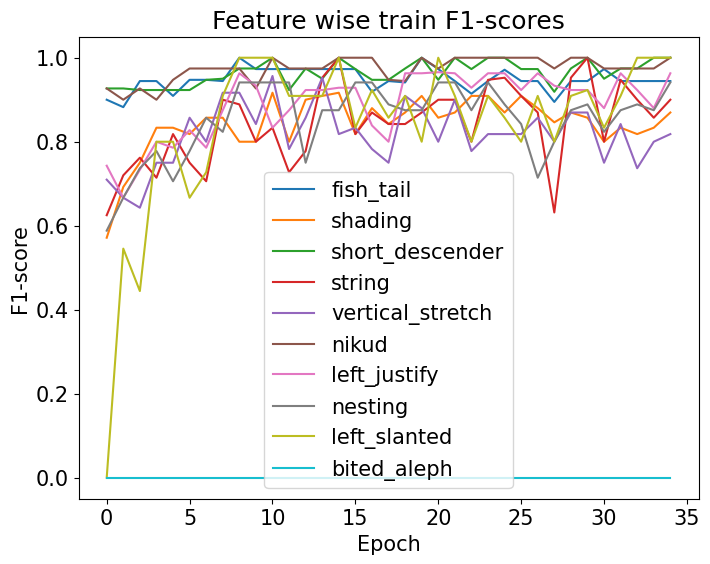

In [17]:
# Prepare data for plotting
class_wise_f1s = {cls: [] for cls in target_names}
class_wise_supports = {cls: [] for cls in target_names}

for epoch_f1 in val_class_f1s:
    for cls in target_names:
        class_wise_f1s[cls].append(epoch_f1[cls])
plt.rcParams.update({'font.size': 15})
# Plot class-wise F1-scores
plt.figure(figsize=(8, 6))
for cls in target_names:
    plt.plot(class_wise_f1s[cls], label=cls)

plt.xlabel('Epoch')
plt.ylabel('F1-score')
plt.title('Feature wise train F1-scores')
plt.legend()
plt.savefig("feature_wise_train_f1scores.png",dpi=300)
plt.show()



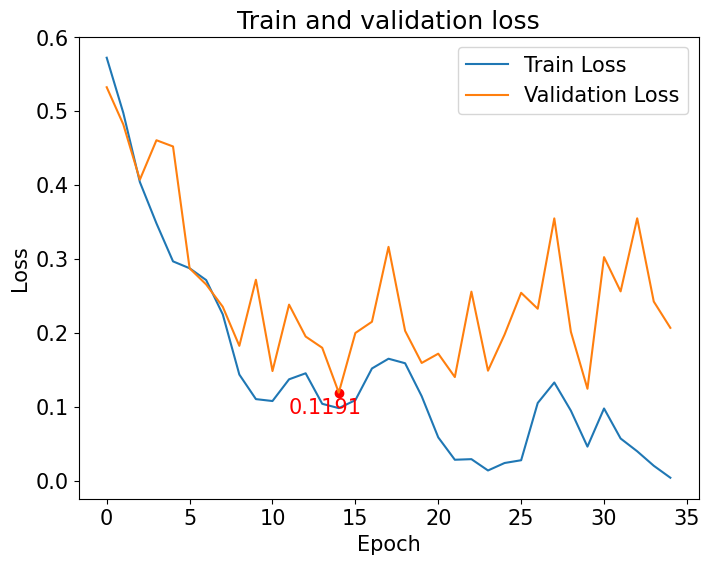

In [18]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(8,6))
plt.rcParams.update({'font.size': 15})
# Plot train and validation losses
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Validation Loss')

# Finding the minimum loss value and its index for train losses
min_train_loss = np.min(train_losses)
min_train_index = np.argmin(train_losses)

# Finding the minimum loss value and its index for validation losses
min_val_loss = np.min(val_losses)
min_val_index = np.argmin(val_losses)


plt.scatter(min_val_index, min_val_loss, color='red') # blue dot
plt.annotate(f'{min_val_loss:.4f}', # rounded to 4 decimal places
             (min_val_index, min_val_loss),
             textcoords="offset points", 
             xytext=(-10,-15),
             ha='center',
             color='red')

# Set labels and title
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Train and validation loss')
plt.legend()

# Save and show the plot
plt.savefig("train_validation_loss.png", dpi=300)
plt.show()


/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg

Final Test Classification Report:
                  precision    recall  f1-score   support

       fish_tail       1.00      1.00      1.00        17
         shading       1.00      0.92      0.96        13
 short_descender       1.00      1.00      1.00        17
          string       1.00      1.00      1.00        12
vertical_stretch       0.94      1.00      0.97        15
           nikud       1.00      1.00      1.00        19
    left_justify       0.92      1.00      0.96        11
         nesting       1.00      1.00      1.00        10
    left_slanted       0.80      1.00      0.89         4
     bited_aleph       0.00      0.00      0.00         0

       micro avg       0.97      0.99      0.98       118
       macro avg       0.87      0.89      0.88       118
    weighted avg       0.98      0.99      0.98       118
     samples avg       0.98      0.99      0.98       118



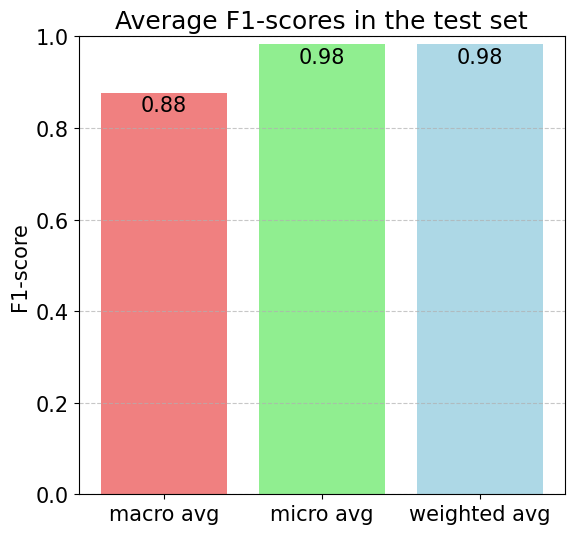

In [23]:
import torch
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report

target_names =  ["fish_tail", "shading", "short_descender", "string", "vertical_stretch", 
                "nikud", "left_justify", "nesting", "left_slanted", "bited_aleph"]

# Calculate final metrics for validation set
all_labels = []
all_outputs = []
with torch.no_grad():
    for inputs, labels in test_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)
        
        outputs = vgg(inputs)
        all_labels.append(labels)
        all_outputs.append(outputs)

all_labels = torch.cat(all_labels)
all_outputs = torch.cat(all_outputs)

# Convert outputs to binary predictions
all_outputs = torch.sigmoid(all_outputs) > 0.5

# Calculate the classification report
test_report = classification_report(all_labels.cpu().numpy(), all_outputs.cpu().numpy(), target_names=target_names, output_dict=True)
print(f'Final Test Classification Report:\n{classification_report(all_labels.cpu().numpy(), all_outputs.cpu().numpy(), target_names=target_names)}')

# Extract F1-scores from the report
f1_scores = [test_report[cls]['f1-score'] for cls in target_names]

# Extract average F1-scores
avg_f1_scores = {
    "macro avg": test_report["macro avg"]["f1-score"],
    "micro avg": test_report["micro avg"]["f1-score"],
    "weighted avg": test_report["weighted avg"]["f1-score"]
}
plt.rcParams.update({'font.size': 15})

# Plot average F1-scores
plt.figure(figsize=(6, 5.6))
avg_labels = list(avg_f1_scores.keys())
avg_scores = list(avg_f1_scores.values())
bars = plt.bar(avg_labels, avg_scores, color=['lightcoral', 'lightgreen', 'lightblue'])
plt.ylabel('F1-score')
plt.title('Average F1-scores in the test set')
plt.ylim(0, 1)  # F1-scores range from 0 to 1
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add numerical labels above the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval-0.05, round(yval, 2), ha='center', va='bottom')

plt.tight_layout()
plt.savefig("avg_f1scores.png", dpi=300)
plt.show()


/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/ipykernel_launcher.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Ground Truth: tensor([1., 1., 1., 1., 1., 1., 1., 0., 0., 0.]), Predicted Label: [1, 1, 1, 1, 1, 1, 1, 0, 0, 0]


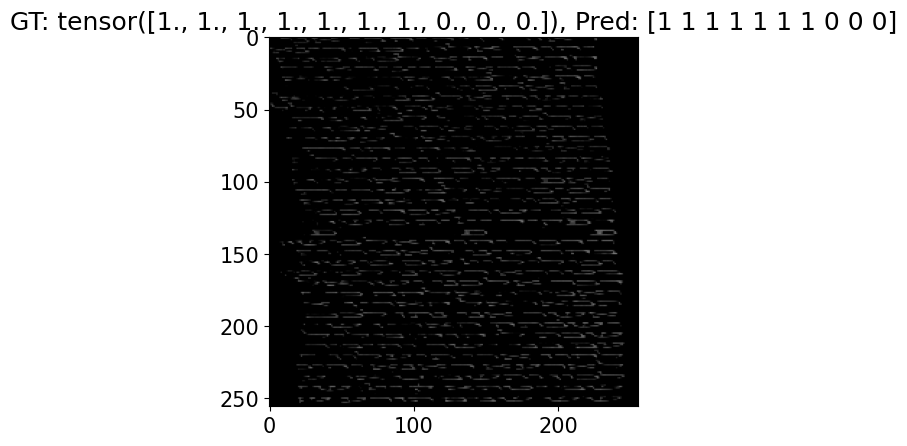

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Ground Truth: tensor([1., 1., 1., 1., 1., 1., 1., 0., 0., 0.]), Predicted Label: [1, 1, 1, 1, 1, 1, 1, 0, 0, 0]


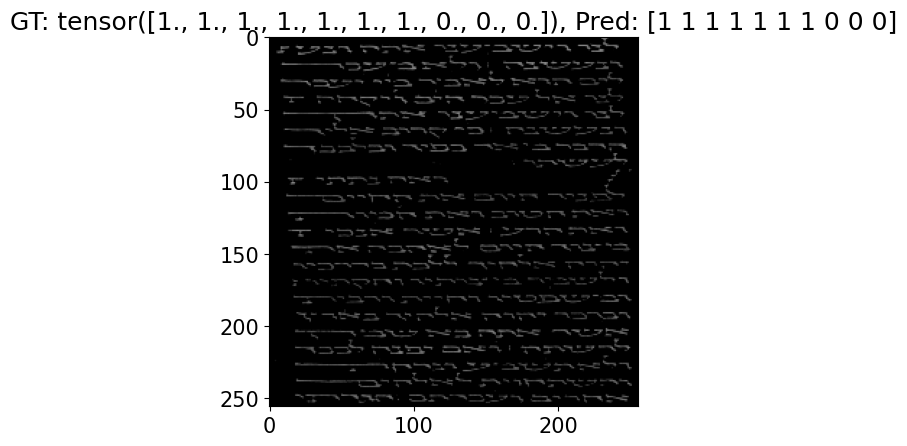

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Ground Truth: tensor([1., 0., 1., 0., 1., 1., 0., 1., 0., 0.]), Predicted Label: [1, 0, 1, 0, 1, 1, 0, 1, 0, 0]


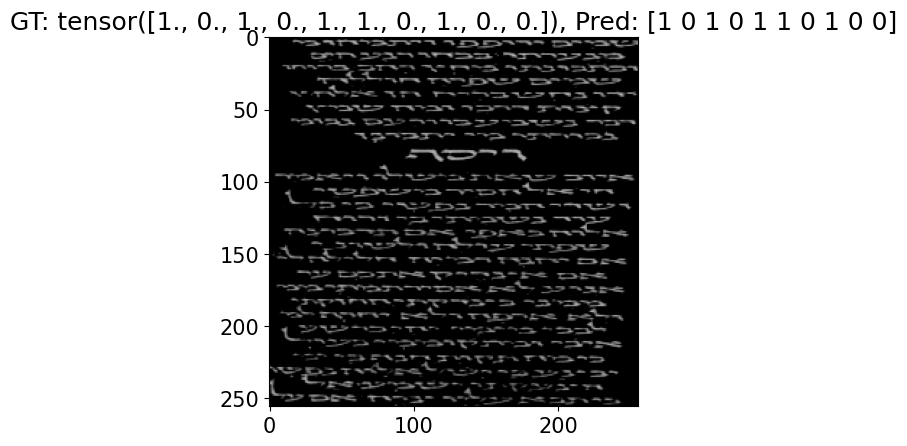

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Ground Truth: tensor([1., 0., 1., 0., 1., 1., 0., 1., 0., 0.]), Predicted Label: [1, 0, 1, 0, 1, 1, 0, 1, 0, 0]


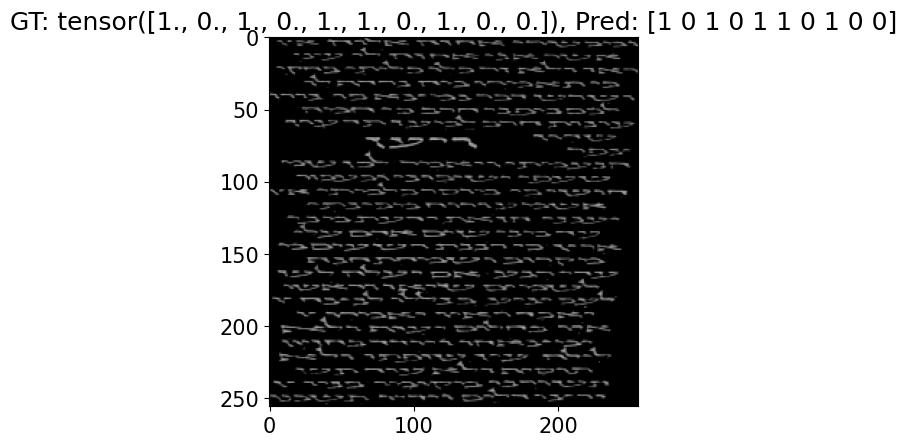

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Ground Truth: tensor([1., 1., 0., 1., 0., 1., 0., 1., 0., 0.]), Predicted Label: [1, 1, 0, 1, 0, 1, 0, 1, 0, 0]


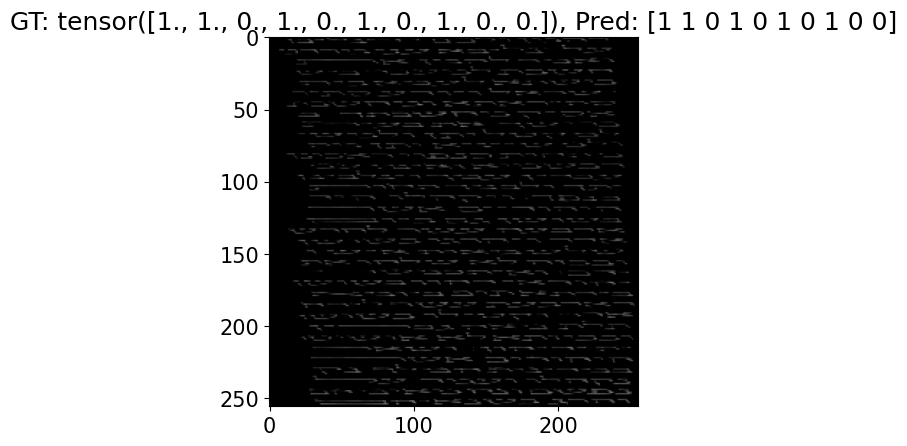

Ground Truth: tensor([1., 1., 1., 1., 1., 1., 1., 0., 0., 0.]), Predicted Label: [1, 1, 1, 1, 1, 1, 1, 0, 0, 0]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


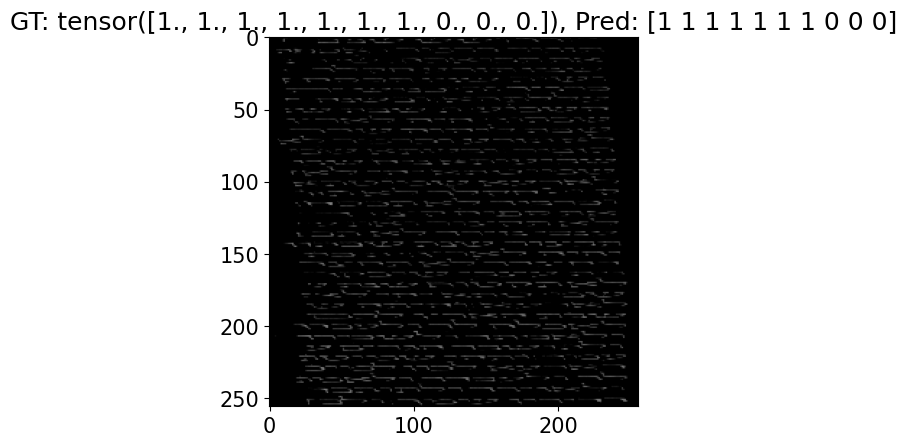

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Ground Truth: tensor([1., 0., 1., 1., 0., 1., 0., 0., 0., 0.]), Predicted Label: [1, 0, 1, 1, 0, 1, 1, 0, 0, 0]


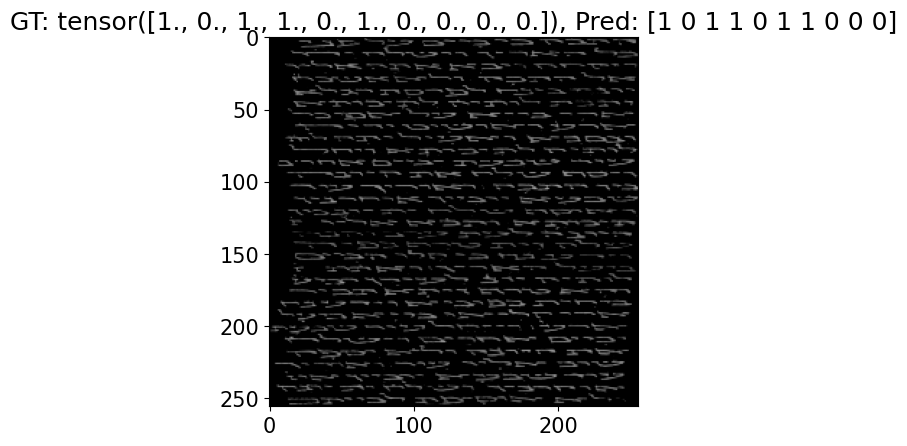

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Ground Truth: tensor([0., 0., 1., 0., 1., 1., 1., 1., 0., 0.]), Predicted Label: [0, 0, 1, 0, 1, 1, 1, 1, 0, 0]


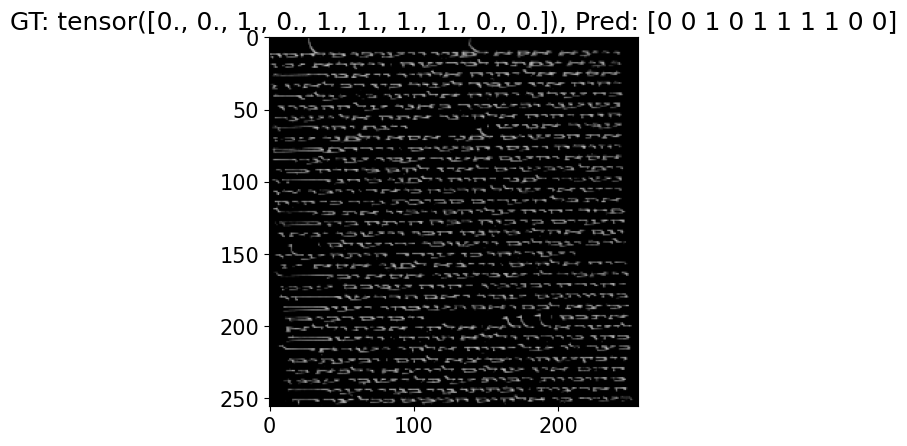

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Ground Truth: tensor([0., 0., 1., 1., 1., 0., 1., 1., 0., 0.]), Predicted Label: [0, 0, 1, 1, 1, 0, 1, 1, 0, 0]


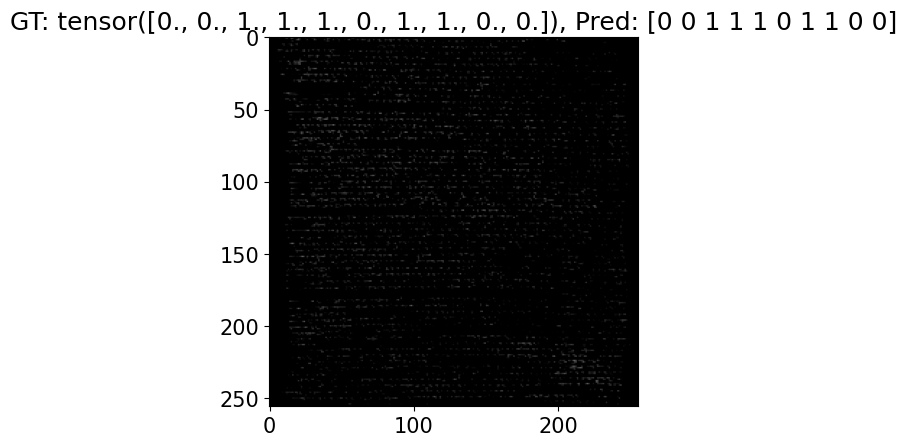

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Ground Truth: tensor([1., 1., 1., 0., 0., 1., 1., 0., 0., 0.]), Predicted Label: [1, 1, 1, 0, 0, 1, 1, 0, 0, 0]


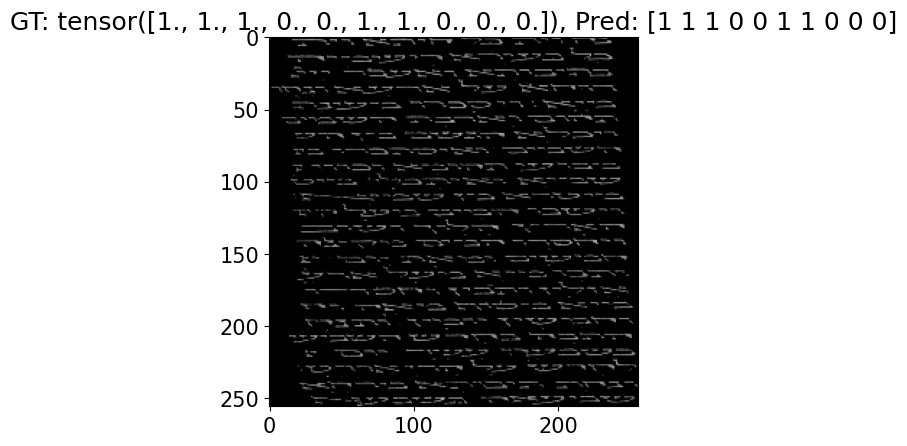

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Ground Truth: tensor([0., 0., 0., 0., 1., 0., 1., 0., 0., 0.]), Predicted Label: [0, 0, 0, 0, 1, 0, 1, 0, 0, 0]


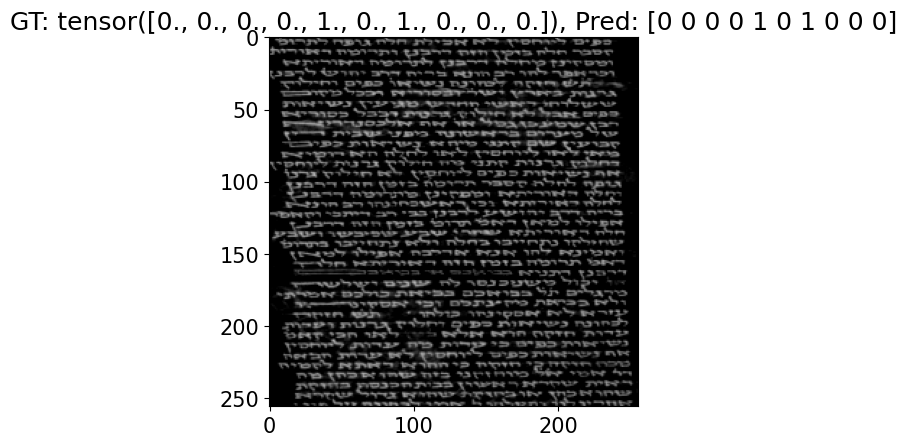

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Ground Truth: tensor([1., 1., 1., 0., 1., 1., 1., 0., 0., 0.]), Predicted Label: [1, 1, 1, 0, 1, 1, 1, 0, 0, 0]


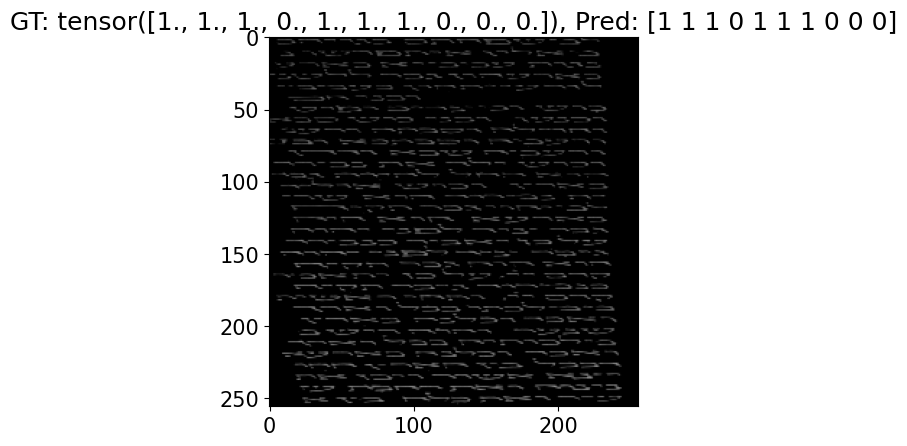

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Ground Truth: tensor([1., 0., 1., 0., 1., 1., 0., 0., 0., 0.]), Predicted Label: [1, 0, 1, 0, 1, 1, 0, 0, 0, 0]


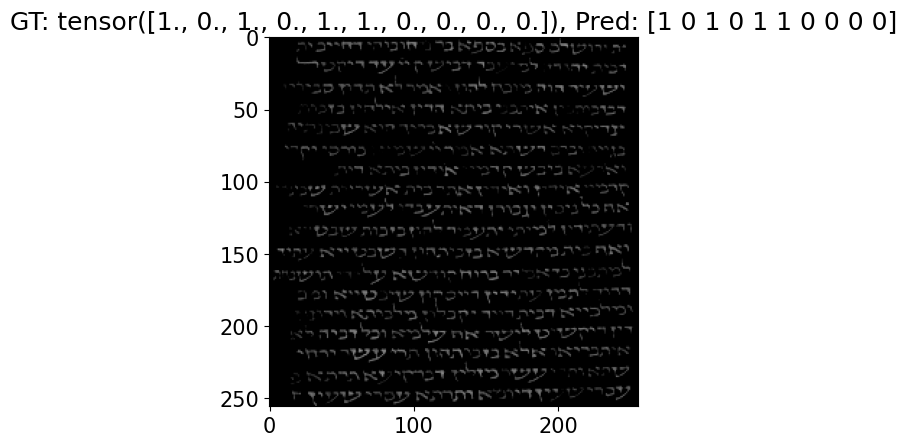

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Ground Truth: tensor([1., 0., 1., 0., 1., 1., 0., 0., 0., 0.]), Predicted Label: [1, 0, 1, 0, 1, 1, 0, 0, 0, 0]


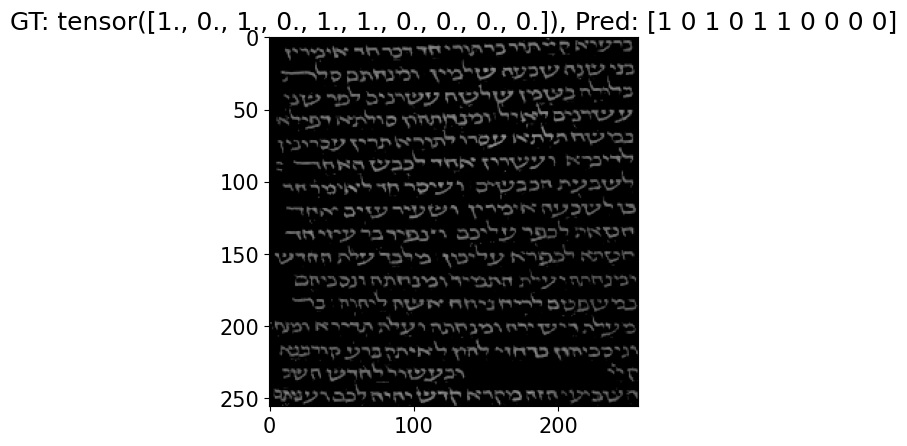

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Ground Truth: tensor([1., 1., 1., 1., 1., 1., 0., 0., 1., 0.]), Predicted Label: [1, 1, 1, 1, 1, 1, 0, 0, 1, 0]


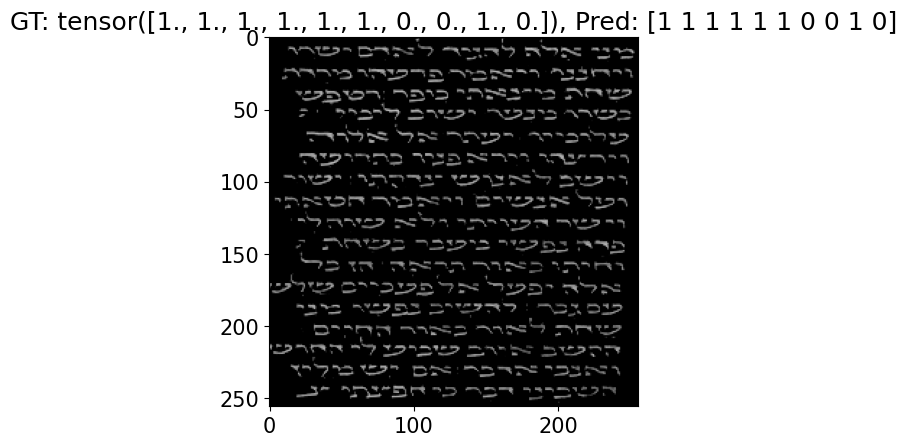

In [24]:
import random
import numpy as np
import matplotlib.pyplot as plt

# Set model to evaluation mode
vgg.eval()

# Generate 15 random indices for test set
random_idx = random.sample(range(len(test_subset)), 15)

# Threshold function for converting predicted labels to 0 or 1
threshold = lambda x: 0 if x < 0.5 else 1

# Loop through each index and predict the label for that image
for idx in random_idx:
    # Get image and label from test set
    image, label = test_subset[idx]
    
    # Convert image to tensor and move to device
    image = torch.tensor(image).unsqueeze(0).to(device)
    
    # Forward pass through model to get predicted label
    output = vgg(image)
    pred = output.squeeze().tolist()
    
    # Apply thresholding to predicted label
    pred_thresholded = [threshold(x) for x in pred]
    
    # Print ground truth and predicted label
    print(f"Ground Truth: {label}, Predicted Label: {pred_thresholded}")
    
    # Plot image with predicted and ground truth label as title
    plt.imshow(image[0].cpu().permute(1,2,0))
    plt.title(f"GT: {label}, Pred: {np.array(pred_thresholded)}")
    plt.show()

In [ ]:
vgg.load_state_dict(torch.load('best_model_11.pth'))

In [25]:
import torch
import torch.nn.functional as F
import torchvision.transforms as transforms
from torchvision import models
import numpy as np
import matplotlib.pyplot as plt
import random
import cv2

# Assuming you already have the following variables defined:
# vgg (your trained model), test_subset, device

# Set model to evaluation mode
vgg.eval()

# Function to register hooks
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None

        # Hook to get gradients
        self.target_layer.register_backward_hook(self.save_gradients)
        # Hook to get activations
        self.target_layer.register_forward_hook(self.save_activations)

    def save_gradients(self, module, grad_input, grad_output):
        self.gradients = grad_output[0]

    def save_activations(self, module, input, output):
        self.activations = output

    def __call__(self, x):
        self.model.zero_grad()
        output = self.model(x)
        pred_class = output.argmax(dim=1).item()
        output[0, pred_class].backward(retain_graph=True)
        gradients = self.gradients.cpu().data.numpy()[0]
        activations = self.activations.cpu().data.numpy()[0]
        pooled_gradients = np.mean(gradients, axis=(1, 2))
        for i in range(activations.shape[0]):
            activations[i, :, :] *= pooled_gradients[i]
        heatmap = np.mean(activations, axis=0)
        heatmap = np.maximum(heatmap, 0)
        heatmap /= np.max(heatmap)
        return heatmap

In [26]:
# Get the target convolutional layer from the VGG model
target_layer = vgg.features[-1]

# Instantiate GradCAM
grad_cam = GradCAM(vgg, target_layer)

# Generate 15 random indices for test set
random_idx = random.sample(range(len(train_subset)), 5)

class_names = ["fish_tail", "shading", "short_descender", "string", "vertical_stretch", 
        "nikud", "left_justify", "nesting", "left_slanted", "bited_aleph"]


# Threshold function for converting predicted labels to 0 or 1
threshold = lambda x: 0 if x < 0.5 else 1

/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  import sys


Ground Truth: ['fish_tail', 'shading', 'short_descender', 'string', 'vertical_stretch', 'nikud', 'left_slanted'], Predicted Label: ['fish_tail', 'shading', 'short_descender', 'string', 'vertical_stretch', 'nikud', 'left_slanted']


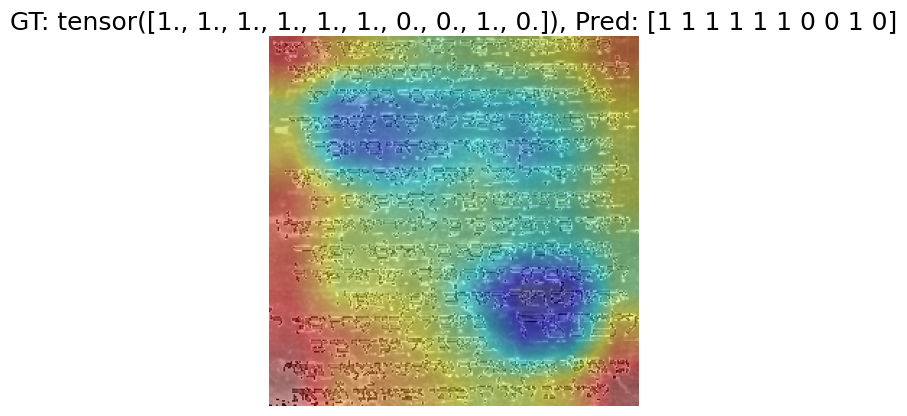

Ground Truth: ['shading', 'short_descender', 'string', 'vertical_stretch', 'left_justify', 'nesting'], Predicted Label: ['shading', 'short_descender', 'string', 'vertical_stretch', 'left_justify', 'nesting']


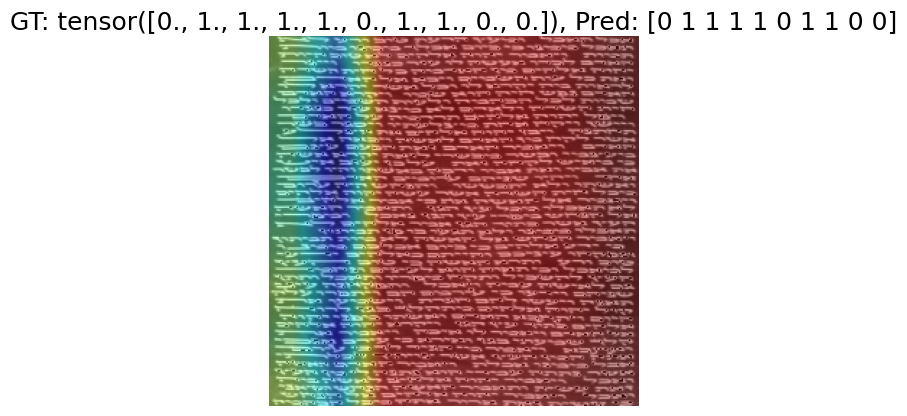

Ground Truth: ['fish_tail', 'shading', 'short_descender', 'vertical_stretch', 'nikud', 'left_justify'], Predicted Label: ['fish_tail', 'shading', 'short_descender', 'vertical_stretch', 'nikud', 'left_justify']


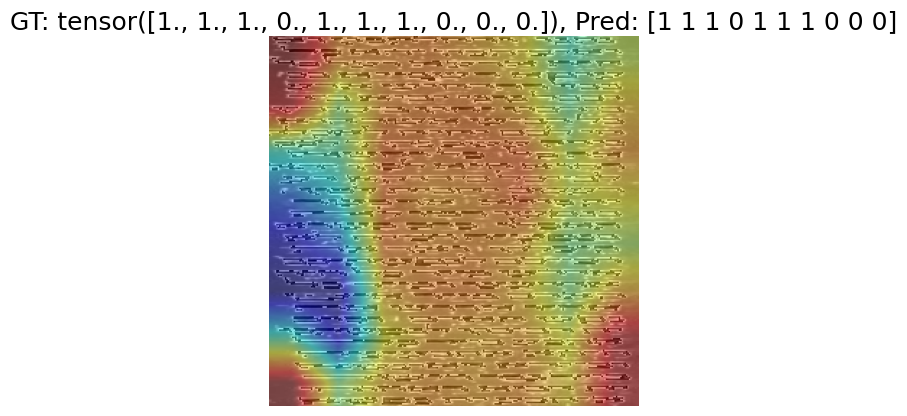

Ground Truth: ['short_descender', 'vertical_stretch', 'nikud', 'left_justify', 'nesting'], Predicted Label: ['short_descender', 'vertical_stretch', 'nikud', 'left_justify', 'nesting']


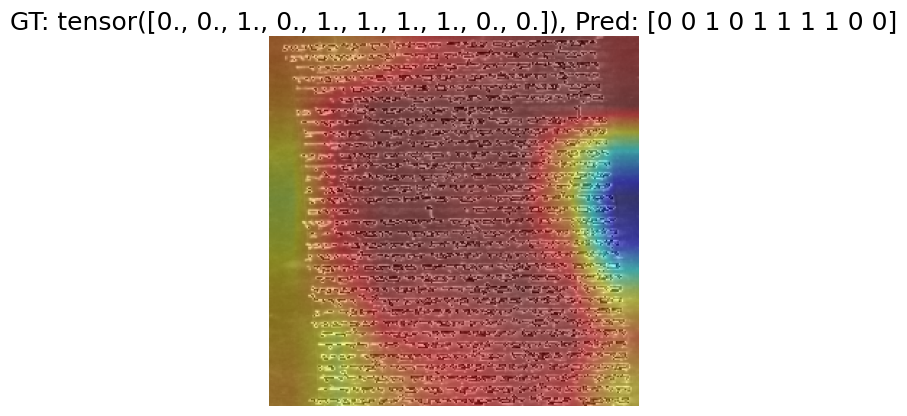

Ground Truth: ['fish_tail', 'shading', 'short_descender', 'string', 'vertical_stretch', 'nikud', 'left_justify'], Predicted Label: ['fish_tail', 'shading', 'short_descender', 'string', 'vertical_stretch', 'nikud', 'left_justify']


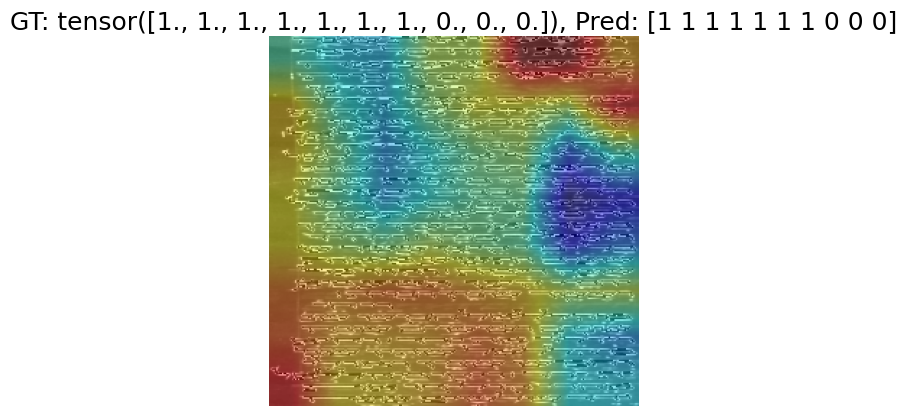

In [27]:
# Loop through each index and predict the label for that image
for idx in random_idx:
    # Get image and label from test set
    image, label = train_subset[idx]
       
    # Convert image to tensor and move to device
    image_tensor = torch.tensor(image).unsqueeze(0).clone().detach().to(device)
    
    # Forward pass through model to get predicted label
    output = vgg(image_tensor)
    pred = output.squeeze().tolist()
    
    # Apply thresholding to predicted label
    pred_thresholded = [threshold(x) for x in pred]
    
    # Convert binary predictions to class names
    pred_class_names = [class_names[i] for i, val in enumerate(pred_thresholded) if val == 1]
    
    # Convert ground truth binary labels to class names
    gt_class_names = [class_names[i] for i, val in enumerate(label) if val == 1]
    
    # Print ground truth and predicted label
    print(f"Ground Truth: {gt_class_names}, Predicted Label: {pred_class_names}")
    
    
    
    # Compute Grad-CAM heatmap
    heatmap = grad_cam(image_tensor)
    
    # Plot original image
    image_np=image.permute(1,2,0)
     # Convert to numpy array
    image_np = image_np.numpy()
     # Normalize image to range [0, 255] and convert to uint8
    image_np = (image_np * 255).astype(np.uint8)
    
    # Resize heatmap to match image size
    heatmap_resized = cv2.resize(heatmap, (image_np.shape[1], image_np.shape[0]))
    
    # Convert heatmap to uint8
    heatmap_resized = np.uint8(255 * heatmap_resized)
    
    # Apply color map to heatmap
    heatmap_colored = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)
    
    # Blend heatmap with original image
    superimposed_img = cv2.addWeighted(image_np, 0.6, heatmap_colored, 0.4, 0)
    
    # Display the result
    plt.imshow(superimposed_img)
    plt.title(f"GT: {label}, Pred: {np.array(pred_thresholded)}")
    plt.axis('off')
    plt.show()

/home/nachum/berat/anaconda3/envs/torchenv/lib/python3.7/site-packages/ipykernel_launcher.py:72: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


Ground Truth: ['fish_tail', 'shading', 'short_descender', 'vertical_stretch', 'nikud', 'left_justify', 'nesting'], Predicted Label: ['fish_tail', 'shading', 'short_descender', 'vertical_stretch', 'nikud', 'left_justify', 'nesting']


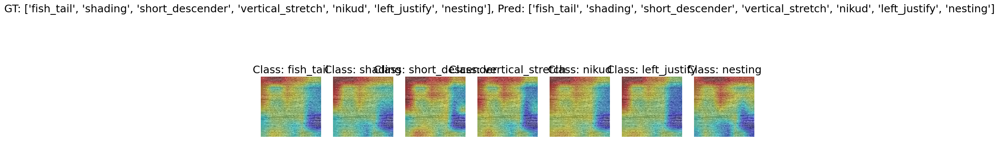

Ground Truth: ['fish_tail', 'shading', 'short_descender', 'string', 'vertical_stretch', 'nikud', 'left_justify'], Predicted Label: ['fish_tail', 'shading', 'short_descender', 'string', 'vertical_stretch', 'nikud', 'left_justify']


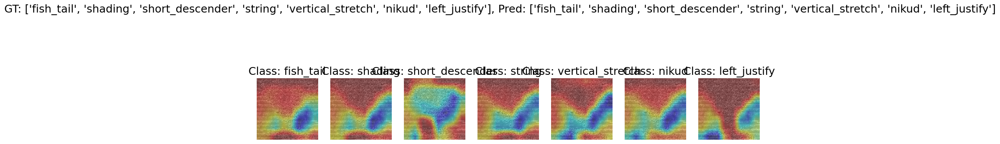

Ground Truth: ['fish_tail', 'shading', 'short_descender', 'string', 'nikud', 'nesting', 'left_slanted'], Predicted Label: ['fish_tail', 'shading', 'short_descender', 'string', 'nikud', 'nesting', 'left_slanted']


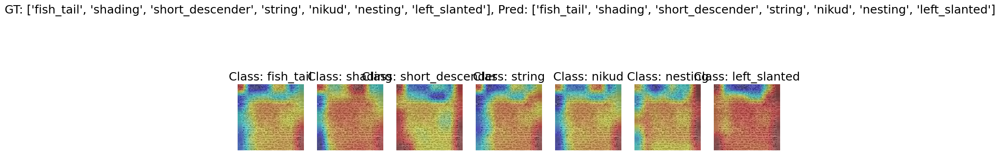

Ground Truth: ['fish_tail', 'shading', 'short_descender', 'nikud', 'left_justify'], Predicted Label: ['fish_tail', 'shading', 'short_descender', 'nikud', 'left_justify']


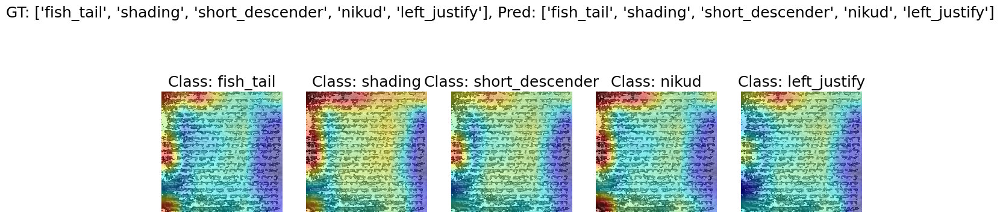

Ground Truth: ['short_descender', 'nikud'], Predicted Label: ['short_descender', 'nikud']


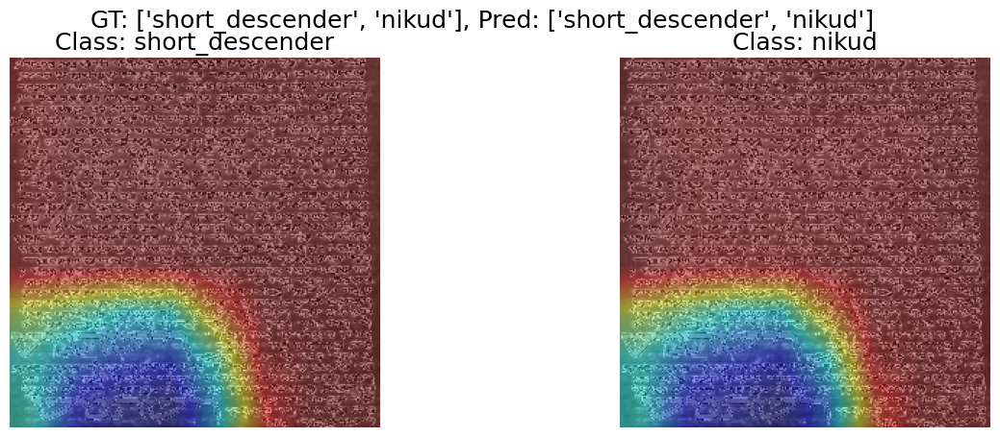

Ground Truth: ['short_descender', 'string', 'vertical_stretch', 'left_justify'], Predicted Label: ['short_descender', 'string', 'vertical_stretch', 'left_justify']


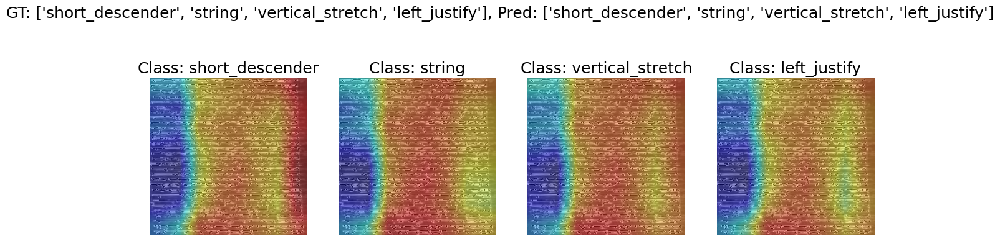

Ground Truth: ['fish_tail', 'shading', 'string', 'nikud', 'nesting'], Predicted Label: ['fish_tail', 'shading', 'string', 'nikud', 'nesting']


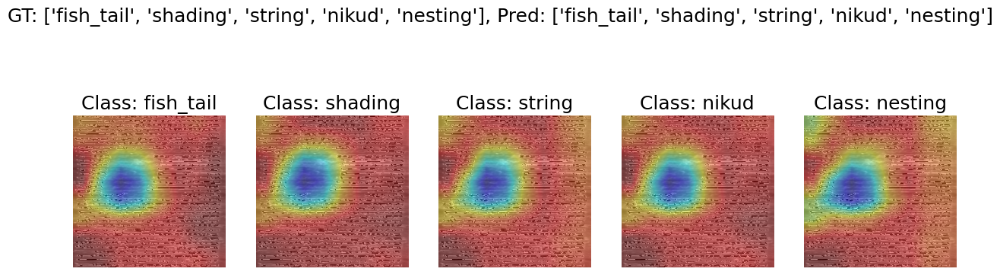

Ground Truth: ['short_descender', 'vertical_stretch', 'nikud', 'left_justify'], Predicted Label: ['short_descender', 'vertical_stretch', 'nikud', 'left_justify']


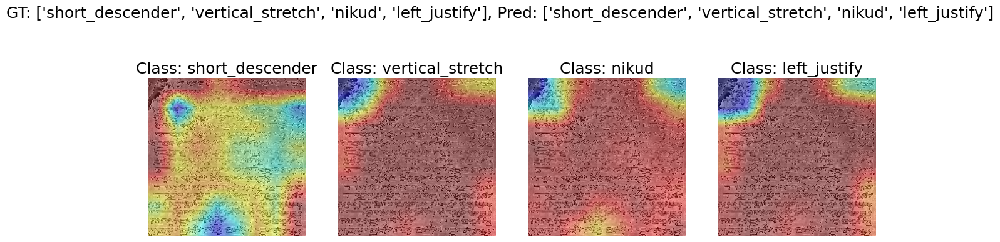

Ground Truth: ['fish_tail', 'shading', 'short_descender', 'string', 'nikud', 'nesting', 'left_slanted'], Predicted Label: ['fish_tail', 'shading', 'short_descender', 'string', 'nikud', 'nesting', 'left_slanted']


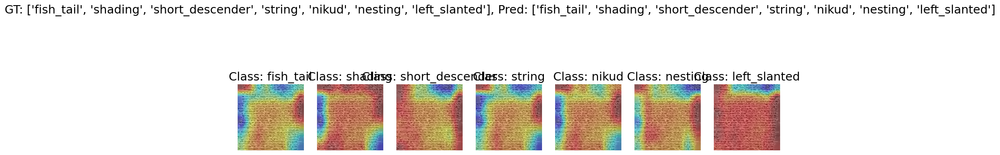

Ground Truth: ['fish_tail', 'short_descender', 'string', 'nikud', 'left_justify', 'nesting', 'left_slanted'], Predicted Label: ['fish_tail', 'short_descender', 'string', 'nikud', 'left_justify', 'nesting', 'left_slanted']


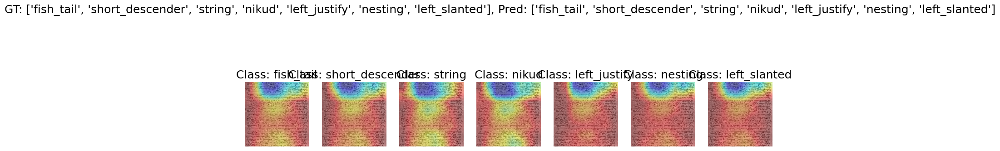

Ground Truth: ['fish_tail', 'shading', 'string', 'nikud', 'nesting'], Predicted Label: ['fish_tail', 'shading', 'string', 'nikud', 'nesting']


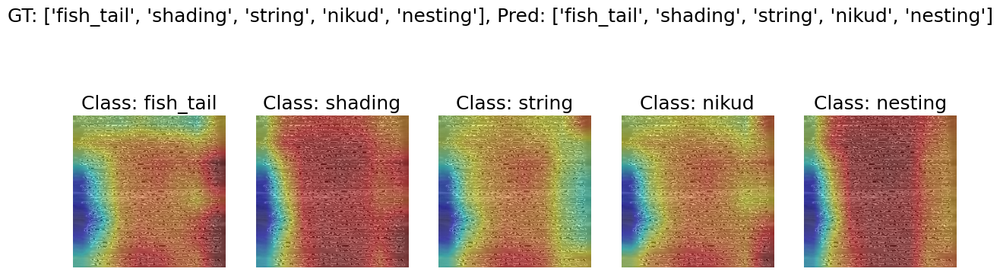

Ground Truth: ['shading', 'short_descender', 'string', 'nikud'], Predicted Label: ['shading', 'short_descender', 'string', 'nikud']


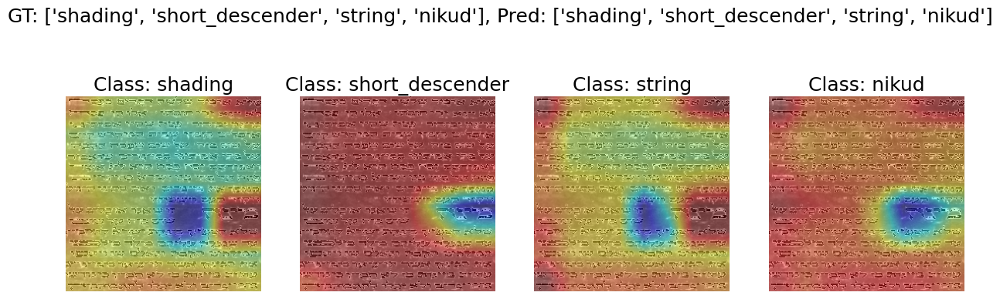

Ground Truth: ['shading', 'short_descender', 'string', 'vertical_stretch', 'left_justify', 'nesting'], Predicted Label: ['shading', 'short_descender', 'string', 'vertical_stretch', 'left_justify', 'nesting']


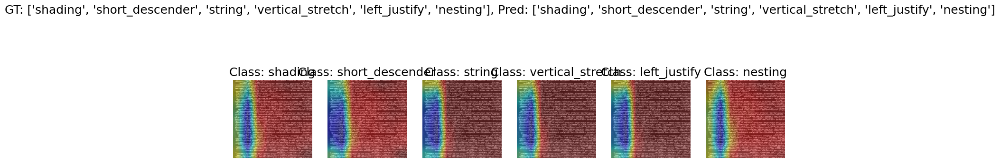

Ground Truth: ['shading', 'short_descender', 'string', 'vertical_stretch', 'left_justify', 'nesting'], Predicted Label: ['shading', 'short_descender', 'string', 'vertical_stretch', 'left_justify', 'nesting']


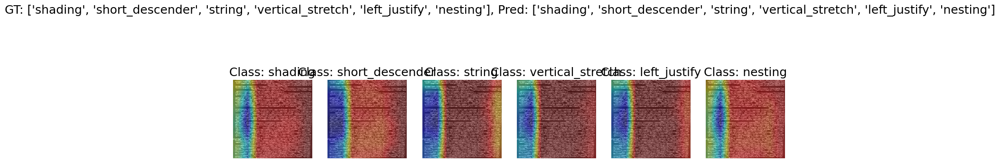

Ground Truth: ['fish_tail', 'short_descender', 'vertical_stretch', 'nesting', 'left_slanted'], Predicted Label: ['fish_tail', 'short_descender', 'vertical_stretch', 'nesting', 'left_slanted']


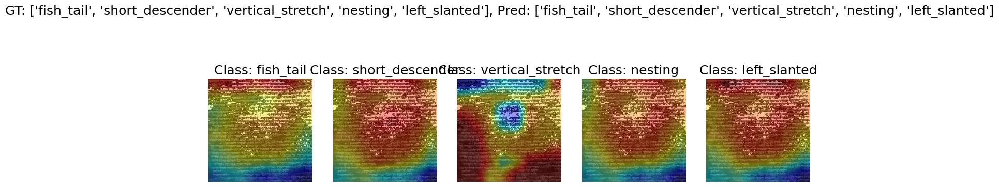

In [28]:
import torch
import torch.nn.functional as F
import torchvision.transforms as transforms
from torchvision import models
import numpy as np
import matplotlib.pyplot as plt
import random
import cv2

# Assuming you already have the following variables defined:
# vgg (your trained model), test_subset, device

# Set model to evaluation mode
vgg.eval()

# Function to register hooks
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None

        # Hook to get gradients
        self.target_layer.register_backward_hook(self.save_gradients)
        # Hook to get activations
        self.target_layer.register_forward_hook(self.save_activations)

    def save_gradients(self, module, grad_input, grad_output):
        self.gradients = grad_output[0]

    def save_activations(self, module, input, output):
        self.activations = output

    def __call__(self, x, target_class):
        self.model.zero_grad()
        output = self.model(x)
        target = output[0, target_class]
        target.backward(retain_graph=True)
        gradients = self.gradients.cpu().data.numpy()[0]
        activations = self.activations.cpu().data.numpy()[0]
        pooled_gradients = np.mean(gradients, axis=(1, 2))
        for i in range(activations.shape[0]):
            activations[i, :, :] *= pooled_gradients[i]
        heatmap = np.mean(activations, axis=0)
        heatmap = np.maximum(heatmap, 0)
        heatmap /= np.max(heatmap)
        return heatmap

# Get the target convolutional layer from the VGG model
target_layer = vgg.features[-1]

# Instantiate GradCAM
grad_cam = GradCAM(vgg, target_layer)

# Generate 15 random indices for test set
random_idx = random.sample(range(len(train_subset)), 15)

# Define class names (replace with your actual class names)
class_names = ["fish_tail", "shading", "short_descender", "string", "vertical_stretch", 
        "nikud", "left_justify", "nesting", "left_slanted", "bited_aleph"]

# Threshold function for converting predicted labels to 0 or 1
threshold = lambda x: 0 if x < 0.5 else 1

# Loop through each index and predict the label for that image
for idx in random_idx:
    # Get image and label from test set
    image, label = train_subset[idx]
    
    # Convert image to tensor and move to device
    image_tensor = torch.tensor(image).unsqueeze(0).clone().detach().to(device)
    
    # Forward pass through model to get predicted label
    output = vgg(image_tensor)
    pred = output.squeeze().tolist()
    
    # Apply thresholding to predicted label
    pred_thresholded = [threshold(x) for x in pred]
    
    # Convert binary predictions to class names
    pred_class_names = [class_names[i] for i, val in enumerate(pred_thresholded) if val == 1]
    
    # Convert ground truth binary labels to class names
    gt_class_names = [class_names[i] for i, val in enumerate(label) if val == 1]
    
    # Print ground truth and predicted label
    print(f"Ground Truth: {gt_class_names}, Predicted Label: {pred_class_names}")
    
    # Convert image to HWC format for plotting
    image_np = image.permute(1, 2, 0)
    image_np = image_np.numpy()
    image_np = (image_np * 255).astype(np.uint8)
    
    # Initialize a figure
    plt.figure(figsize=(15, 5))
    
    # Compute and plot Grad-CAM heatmap for each class in pred_class_names
    for i, class_name in enumerate(class_names):
        if class_name in pred_class_names:
            heatmap = grad_cam(image_tensor, i)
            heatmap_resized = cv2.resize(heatmap, (image_np.shape[1], image_np.shape[0]))
            heatmap_resized = np.uint8(255 * heatmap_resized)
            heatmap_colored = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)
            superimposed_img = cv2.addWeighted(image_np, 0.6, heatmap_colored, 0.4, 0)
            
            plt.subplot(1, len(pred_class_names), pred_class_names.index(class_name) + 1)
            plt.imshow(superimposed_img)
            plt.title(f"Class: {class_name}")
            plt.axis('off')
    
    plt.suptitle(f"GT: {gt_class_names}, Pred: {pred_class_names}")
    plt.show()
